## K-Fold 교차 검증
데이터 적음 -> 훈련/검증 데이터가 적어짐 -> 평가 결과가 운에 따라 크게 달라질 수 있음 <br>
**K-Fold는?** 데이터를 K개로 나누고 돌아가면서 한 번씩 검증용으로 쓰는 성능 평가 기법 <br>
ex) 데이터 100개, K=5 -> 20개씩 5등분 <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 1번째: 1조각 검증, 나머지 학습<br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 2번째: 2조각 검증, 나머지 학습<br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 마지막 5번 결과 평균이 최종 성능

즉, 모든 데이터가 한 번은 검증용, 여러 번은 학습용으로 쓰임 -> 데이터 낭비 없음

In [2]:
!unzip "/content/Raccoon.v38-416x416-resize.yolov8 (2).zip" -d dataset

Archive:  /content/Raccoon.v38-416x416-resize.yolov8 (2).zip
   creating: dataset/Raccoon.v38-416x416-resize.yolov8/
  inflating: dataset/Raccoon.v38-416x416-resize.yolov8/data.yaml  
   creating: dataset/Raccoon.v38-416x416-resize.yolov8/images/
  inflating: dataset/Raccoon.v38-416x416-resize.yolov8/images/raccoon-100_jpg.rf.e9338202a924dc489ffd94e0291a0f39.jpg  
  inflating: dataset/Raccoon.v38-416x416-resize.yolov8/images/raccoon-101_jpg.rf.a9e8a95f51d60d7d3b40d3243aa11afd.jpg  
  inflating: dataset/Raccoon.v38-416x416-resize.yolov8/images/raccoon-102_jpg.rf.d140a1fcbfc8d62c7ad37167714f79df.jpg  
  inflating: dataset/Raccoon.v38-416x416-resize.yolov8/images/raccoon-103_jpg.rf.7148e5c7d785760fe9cb6b7762180977.jpg  
  inflating: dataset/Raccoon.v38-416x416-resize.yolov8/images/raccoon-104_jpg.rf.e5f8de5f977a32d8a7f2223574ff2b72.jpg  
  inflating: dataset/Raccoon.v38-416x416-resize.yolov8/images/raccoon-105_jpg.rf.73bb0ca933f4a5d8e47ee57c46617cd7.jpg  
  inflating: dataset/Raccoon.v38-

In [3]:
from pathlib import Path
import yaml
import shutil
from collections import Counter
from tqdm import tqdm
import pandas as pd
from sklearn.model_selection import KFold
import datetime

dataset_dir = Path("/content/dataset")
img_dir   = dataset_dir / "images"
label_dir = dataset_dir / "labels"
data_yaml = dataset_dir / "data.yaml"

In [4]:
ksplilt = 5
random_split = 20
batch = 16
epochs = 100
project = "kfold_demo"
weight = "yolov8s.pt"

In [ ]:
with open(data_yaml, encoding="utf-8") as y:
    names = yaml.safe_load(y)["names"]

if isinstance(names, list):
    cls_idx = list(range(len(names)))
    classes = {i: n for i, n in enumerate(names)}
elif isinstance(names, dict):
    cls_idx = sorted(int(k) for k in names.keys())
    classes = {int(k): v for k, v in names.items()}

In [ ]:
label_files = sorted(label_dir.rglob("*.txt"))
exts = {".jpg", ".jpeg", ".png"}
pairs = [] 
missing = []

for lf in label_files:
    stem = lf.stem
    img = None
    for ext in exts:
        cand = img_dir / f"{stem}{ext}"
        if cand.exists():
            img = cand
            break
    if img is None:
        missing.append(stem)
    else:
        pairs.append((img, lf))

if missing:
    print(f"[경고] 이미지가 누락된 라벨 {len(missing)}개 예: {missing[:5]}")

if not pairs:
    raise RuntimeError("매칭된 이미지-라벨 쌍이 없습니다. 파일명(stem) 일치를 확인하세요.")

In [ ]:
index = [p[0].stem for p in pairs]
labels_df = pd.DataFrame(0.0, columns=cls_idx, index=index)

for img_path, lbl_path in pairs:
    cnt = Counter()
    with open(lbl_path, "r") as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            c = int(line.split(" ", 1)[0])
            cnt[c] += 1
    for k, v in cnt.items():
        if k in labels_df.columns:
            labels_df.at[img_path.stem, k] = float(v)

In [ ]:
kf = KFold(n_splits=ksplilt, shuffle=True, random_state=random_split)
kfolds = list(kf.split(labels_df))

folds = [f"split_{i}" for i in range(1, ksplilt + 1)]
folds_df = pd.DataFrame(index=index, columns=folds)
for i, (train_idx, val_idx) in enumerate(kfolds, start=1):
    folds_df.loc[labels_df.iloc[train_idx].index, f"split_{i}"] = "train"
    folds_df.loc[labels_df.iloc[val_idx].index,  f"split_{i}"] = "val"

fold_lbl_distrb = pd.DataFrame(index=folds, columns=cls_idx)
for i, (train_idx, val_idx) in enumerate(kfolds, start=1):
    tr_tot = labels_df.iloc[train_idx].sum()
    va_tot = labels_df.iloc[val_idx].sum()
    fold_lbl_distrb.loc[f"split_{i}"] = (va_tot / (tr_tot + 1e-7))

In [ ]:
root_out = dataset_dir / f"{datetime.date.today().isoformat()}_{ksplilt}-Fold_CV"
root_out.mkdir(parents=True, exist_ok=True)
ds_yamls = []

for split in folds_df.columns:
    split_dir = root_out / split
    (split_dir / "train" / "images").mkdir(parents=True, exist_ok=True)
    (split_dir / "train" / "labels").mkdir(parents=True, exist_ok=True)
    (split_dir / "val" / "images").mkdir(parents=True, exist_ok=True)
    (split_dir / "val" / "labels").mkdir(parents=True, exist_ok=True)

    dataset_yaml = split_dir / f"{split}_dataset.yaml"
    with open(dataset_yaml, "w", encoding="utf-8") as ds_y:
        yaml.safe_dump(
            {
                "path": split_dir.as_posix(),
                "train": "train",
                "val": "val",
                "names": classes,
            },
            ds_y,
            allow_unicode=True,
            sort_keys=False,
        )
    ds_yamls.append(dataset_yaml)

for img_path, lbl_path in tqdm(pairs, total=len(pairs), desc="Copying"):
    stem = img_path.stem
    row = folds_df.loc[stem]
    for split, role in row.items(): 
        to_img = root_out / split / role / "images" / img_path.name
        to_lbl = root_out / split / role / "labels" / lbl_path.name
        if not to_img.exists():
            shutil.copy(img_path, to_img)
        if not to_lbl.exists():
            shutil.copy(lbl_path, to_lbl)

Copying: 100%|██████████| 196/196 [00:00<00:00, 4079.33it/s]


In [27]:
folds_df.to_csv(root_out / "kfold_datasplit.csv", encoding="utf-8")
fold_lbl_distrb.to_csv(root_out / "kfold_label_distribution.csv", encoding="utf-8")

In [12]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 36.3 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

results_paths = []
for i, dataset_yaml in enumerate(ds_yamls, start=1):
    model = YOLO(weight, task="detect")
    print(f"\n=== Training fold_{i} ===")
    r = model.train(
        data=str(dataset_yaml),
        epochs=epochs,
        imgsz=640,
        patience=50,
        batch=batch,
        project=project,
        name=f"fold_{i}",
    )
    results_paths.append(r)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

=== Training fold_1 ===
Ultralytics 8.3.191 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/2025-09-02_5-Fold_CV/split_1/split_1_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, h

In [ ]:
import matplotlib.pyplot as plt
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train2/weights/best.pt")
results = model.predict(source="/content/dataset/test/images")

count = min(16, len(results))
plt.figure(figsize=(10, 10))

for i, res in enumerate(results[:count]):
    img = res.plot()
    ax = plt.subplot(4, 4, i + 1)
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(f"Test Image {i+1}")

plt.tight_layout()
plt.show()

In [ ]:
from ultralytics import YOLO

weights = [
    "/content/kfold_demo/fold_1/weights/best.pt",
    "/content/kfold_demo/fold_2/weights/best.pt",
    "/content/kfold_demo/fold_3/weights/best.pt",
    "/content/kfold_demo/fold_4/weights/best.pt",
    "/content/kfold_demo/fold_5/weights/best.pt",
]

results = []

for i, w in enumerate(weights, start=1):
    model = YOLO(w)
    metrics = model.val(data="/content/dataset/data.yaml", split="val")

    print(f"\n=== Fold {i} ===")
    print("mAP50-95:", metrics.box.map)
    print("mAP50:   ", metrics.box.map50)
    print("Precision:", metrics.box.mp)
    print("Recall:   ", metrics.box.mr)

    results.append({
        "fold": i,
        "mAP50-95": metrics.box.map,
        "mAP50": metrics.box.map50,
        "Precision": metrics.box.mp,
        "Recall": metrics.box.mr
    })

Ultralytics 8.3.191 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1061.2±276.0 MB/s, size: 33.3 KB)
val: Scanning /content/dataset/2025-09-02_5-Fold_CV/split_1/val/labels.cache... 40 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 40/40 47127.0it/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.9it/s 1.6s
                   all         40         41      0.975      0.965      0.976      0.704
Speed: 4.0ms preprocess, 10.1ms inference, 0.0ms loss, 11.2ms postprocess per image
Results saved to runs/detect/val8

=== Fold 1 ===
mAP50-95: 0.703760860165281
mAP50:    0.975695445715519
Precision: 0.9753506593939577
Recall:    0.9652458879534314
Ultralytics 8.3.191 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,125,971 p

In [33]:
import pandas as pd
from statistics import mean, pstdev

df = pd.DataFrame(results).set_index("fold")
print("fold별 성능 요약")
print(df)

print("평균+-표준편차")
for k in ["Precision", "Recall", "mAP50", "mAP50-95"]:
    vals = df[k].tolist()
    print(f"{k}: {mean(vals):.4f} ± {pstdev(vals):.4f}")

fold별 성능 요약
      mAP50-95     mAP50  Precision    Recall
fold                                         
1     0.703761  0.975695   0.975351  0.965246
2     0.900309  0.995000   0.995757  1.000000
3     0.930157  0.995000   0.998406  1.000000
4     0.909161  0.995000   1.000000  0.998086
5     0.889473  0.995000   1.000000  0.999371
평균+-표준편차
Precision: 0.9939 ± 0.0094
Recall: 0.9925 ± 0.0137
mAP50: 0.9911 ± 0.0077
mAP50-95: 0.8666 ± 0.0825



image 1/17 /content/test/images/raccoon-57_jpg.rf.26f3fae218f26088f6a7405c58ae8020.jpg: 640x640 1 raccoon, 19.1ms
image 2/17 /content/test/images/raccoon-58_jpg.rf.ff9de9977475e0086e7ab582122c5167.jpg: 640x640 1 raccoon, 16.3ms
image 3/17 /content/test/images/raccoon-59_jpg.rf.388d6dd8c9d5a6fc7ca75790e680c269.jpg: 640x640 1 raccoon, 16.2ms
image 4/17 /content/test/images/raccoon-60_jpg.rf.cff8b797e6b5c9b716b6be70be2b6b33.jpg: 640x640 1 raccoon, 16.2ms
image 5/17 /content/test/images/raccoon-61_jpg.rf.58c4f561336525f59d395ce21508523b.jpg: 640x640 2 raccoons, 16.2ms
image 6/17 /content/test/images/raccoon-62_jpg.rf.e997ede5457f069436178f08065d9a61.jpg: 640x640 1 raccoon, 16.2ms
image 7/17 /content/test/images/raccoon-63_jpg.rf.1b33356e79739a8a1f3676a9f4f9f97a.jpg: 640x640 2 raccoons, 16.2ms
image 8/17 /content/test/images/raccoon-64_jpg.rf.5201bb870708d051100bbbb8c148ecd2.jpg: 640x640 1 raccoon, 10.9ms
image 9/17 /content/test/images/raccoon-66_jpg.rf.447ffe6a6b6cd768de213288bb000418.jp

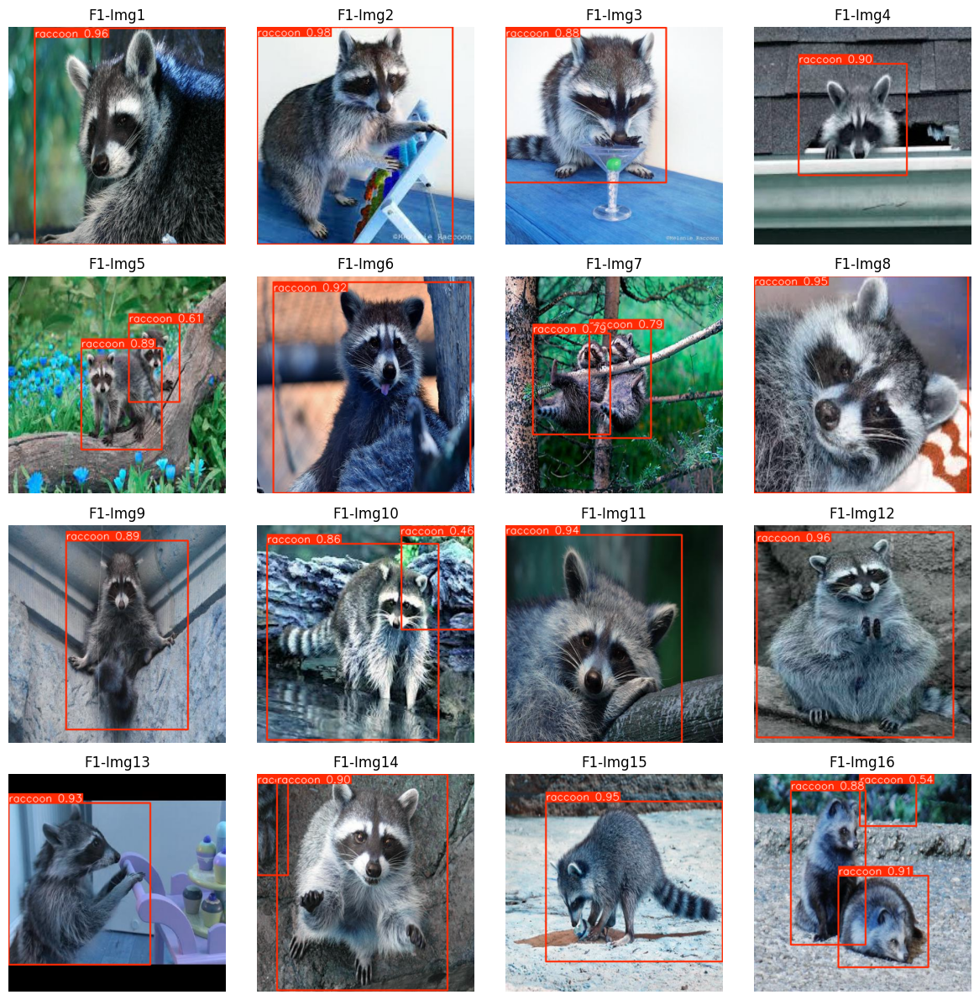


image 1/17 /content/test/images/raccoon-57_jpg.rf.26f3fae218f26088f6a7405c58ae8020.jpg: 640x640 1 raccoon, 16.2ms
image 2/17 /content/test/images/raccoon-58_jpg.rf.ff9de9977475e0086e7ab582122c5167.jpg: 640x640 1 raccoon, 16.2ms
image 3/17 /content/test/images/raccoon-59_jpg.rf.388d6dd8c9d5a6fc7ca75790e680c269.jpg: 640x640 1 raccoon, 16.2ms
image 4/17 /content/test/images/raccoon-60_jpg.rf.cff8b797e6b5c9b716b6be70be2b6b33.jpg: 640x640 1 raccoon, 16.3ms
image 5/17 /content/test/images/raccoon-61_jpg.rf.58c4f561336525f59d395ce21508523b.jpg: 640x640 1 raccoon, 16.2ms
image 6/17 /content/test/images/raccoon-62_jpg.rf.e997ede5457f069436178f08065d9a61.jpg: 640x640 1 raccoon, 13.2ms
image 7/17 /content/test/images/raccoon-63_jpg.rf.1b33356e79739a8a1f3676a9f4f9f97a.jpg: 640x640 2 raccoons, 13.2ms
image 8/17 /content/test/images/raccoon-64_jpg.rf.5201bb870708d051100bbbb8c148ecd2.jpg: 640x640 1 raccoon, 13.2ms
image 9/17 /content/test/images/raccoon-66_jpg.rf.447ffe6a6b6cd768de213288bb000418.jpg

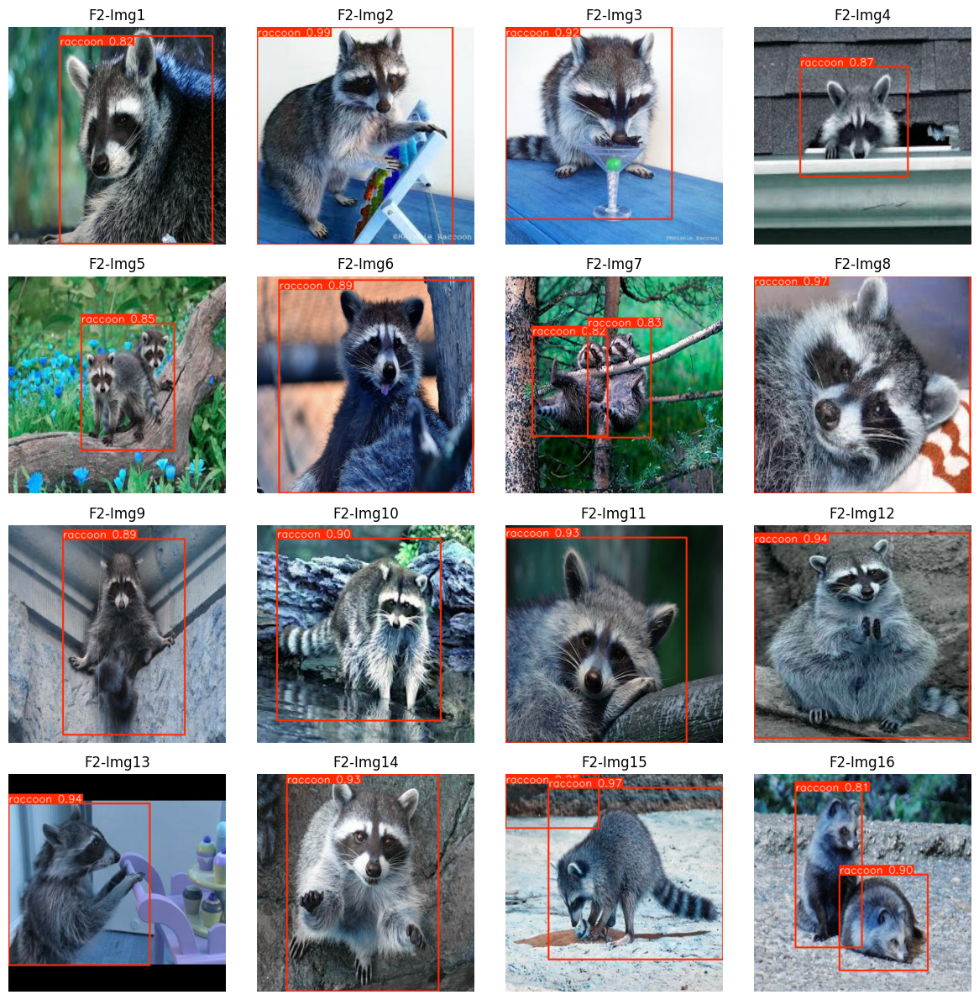


image 1/17 /content/test/images/raccoon-57_jpg.rf.26f3fae218f26088f6a7405c58ae8020.jpg: 640x640 1 raccoon, 16.2ms
image 2/17 /content/test/images/raccoon-58_jpg.rf.ff9de9977475e0086e7ab582122c5167.jpg: 640x640 1 raccoon, 16.3ms
image 3/17 /content/test/images/raccoon-59_jpg.rf.388d6dd8c9d5a6fc7ca75790e680c269.jpg: 640x640 1 raccoon, 16.2ms
image 4/17 /content/test/images/raccoon-60_jpg.rf.cff8b797e6b5c9b716b6be70be2b6b33.jpg: 640x640 1 raccoon, 16.2ms
image 5/17 /content/test/images/raccoon-61_jpg.rf.58c4f561336525f59d395ce21508523b.jpg: 640x640 2 raccoons, 17.4ms
image 6/17 /content/test/images/raccoon-62_jpg.rf.e997ede5457f069436178f08065d9a61.jpg: 640x640 1 raccoon, 16.2ms
image 7/17 /content/test/images/raccoon-63_jpg.rf.1b33356e79739a8a1f3676a9f4f9f97a.jpg: 640x640 2 raccoons, 16.2ms
image 8/17 /content/test/images/raccoon-64_jpg.rf.5201bb870708d051100bbbb8c148ecd2.jpg: 640x640 1 raccoon, 16.3ms
image 9/17 /content/test/images/raccoon-66_jpg.rf.447ffe6a6b6cd768de213288bb000418.jp

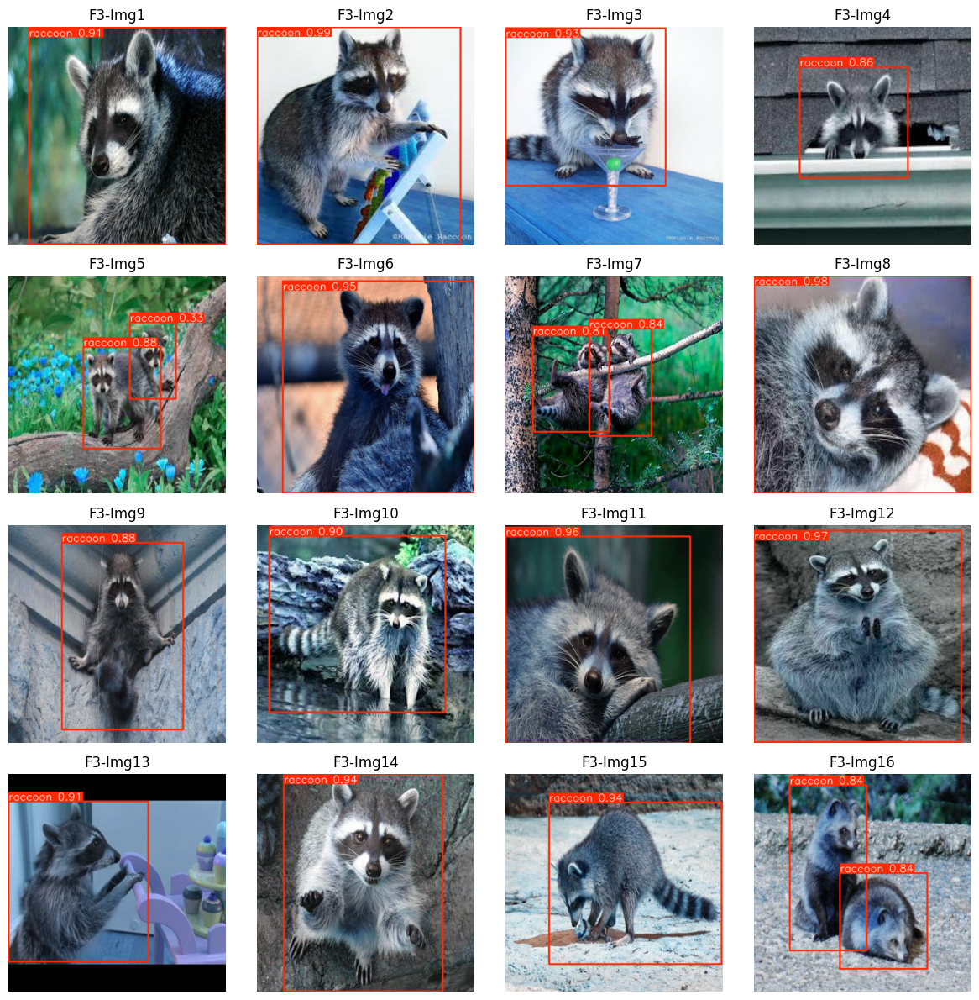


image 1/17 /content/test/images/raccoon-57_jpg.rf.26f3fae218f26088f6a7405c58ae8020.jpg: 640x640 1 raccoon, 16.2ms
image 2/17 /content/test/images/raccoon-58_jpg.rf.ff9de9977475e0086e7ab582122c5167.jpg: 640x640 1 raccoon, 16.2ms
image 3/17 /content/test/images/raccoon-59_jpg.rf.388d6dd8c9d5a6fc7ca75790e680c269.jpg: 640x640 1 raccoon, 16.2ms
image 4/17 /content/test/images/raccoon-60_jpg.rf.cff8b797e6b5c9b716b6be70be2b6b33.jpg: 640x640 1 raccoon, 16.2ms
image 5/17 /content/test/images/raccoon-61_jpg.rf.58c4f561336525f59d395ce21508523b.jpg: 640x640 2 raccoons, 16.2ms
image 6/17 /content/test/images/raccoon-62_jpg.rf.e997ede5457f069436178f08065d9a61.jpg: 640x640 1 raccoon, 13.2ms
image 7/17 /content/test/images/raccoon-63_jpg.rf.1b33356e79739a8a1f3676a9f4f9f97a.jpg: 640x640 2 raccoons, 13.2ms
image 8/17 /content/test/images/raccoon-64_jpg.rf.5201bb870708d051100bbbb8c148ecd2.jpg: 640x640 1 raccoon, 13.2ms
image 9/17 /content/test/images/raccoon-66_jpg.rf.447ffe6a6b6cd768de213288bb000418.jp

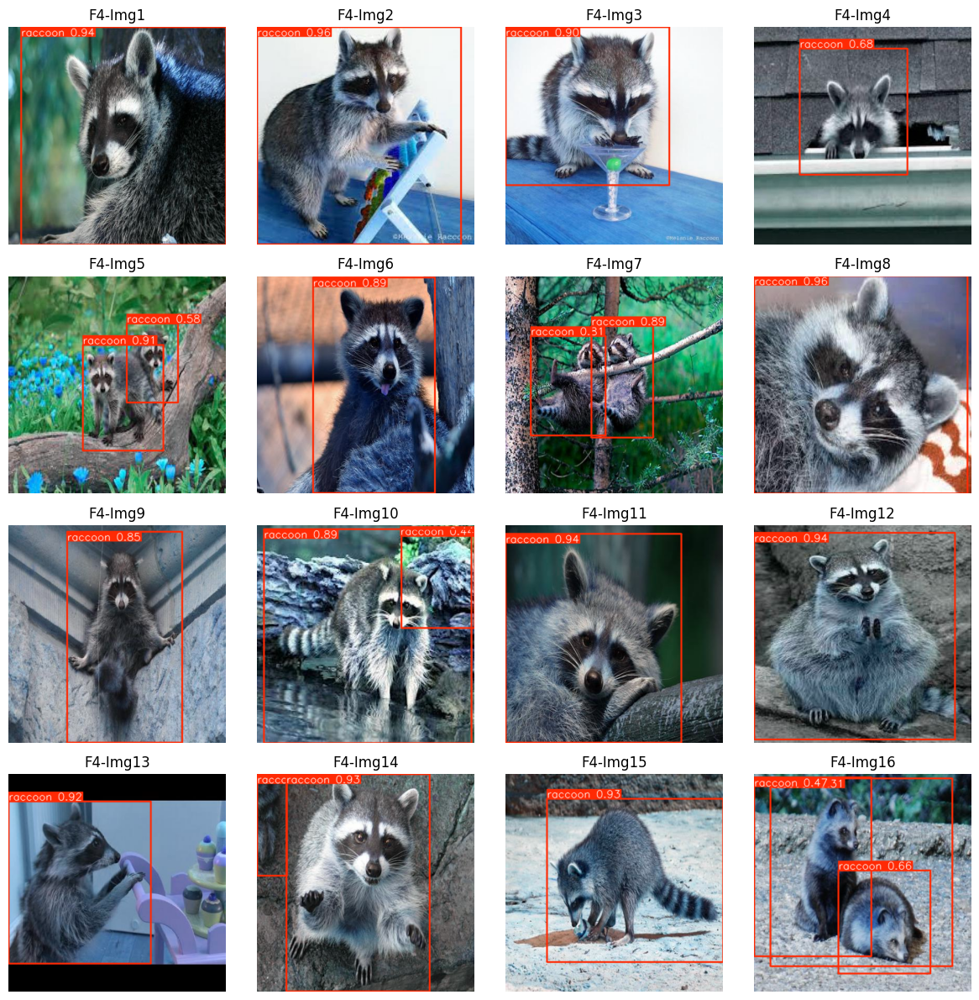


image 1/17 /content/test/images/raccoon-57_jpg.rf.26f3fae218f26088f6a7405c58ae8020.jpg: 640x640 1 raccoon, 16.2ms
image 2/17 /content/test/images/raccoon-58_jpg.rf.ff9de9977475e0086e7ab582122c5167.jpg: 640x640 1 raccoon, 16.3ms
image 3/17 /content/test/images/raccoon-59_jpg.rf.388d6dd8c9d5a6fc7ca75790e680c269.jpg: 640x640 1 raccoon, 16.3ms
image 4/17 /content/test/images/raccoon-60_jpg.rf.cff8b797e6b5c9b716b6be70be2b6b33.jpg: 640x640 1 raccoon, 16.2ms
image 5/17 /content/test/images/raccoon-61_jpg.rf.58c4f561336525f59d395ce21508523b.jpg: 640x640 2 raccoons, 15.6ms
image 6/17 /content/test/images/raccoon-62_jpg.rf.e997ede5457f069436178f08065d9a61.jpg: 640x640 1 raccoon, 15.0ms
image 7/17 /content/test/images/raccoon-63_jpg.rf.1b33356e79739a8a1f3676a9f4f9f97a.jpg: 640x640 1 raccoon, 14.9ms
image 8/17 /content/test/images/raccoon-64_jpg.rf.5201bb870708d051100bbbb8c148ecd2.jpg: 640x640 1 raccoon, 18.4ms
image 9/17 /content/test/images/raccoon-66_jpg.rf.447ffe6a6b6cd768de213288bb000418.jpg

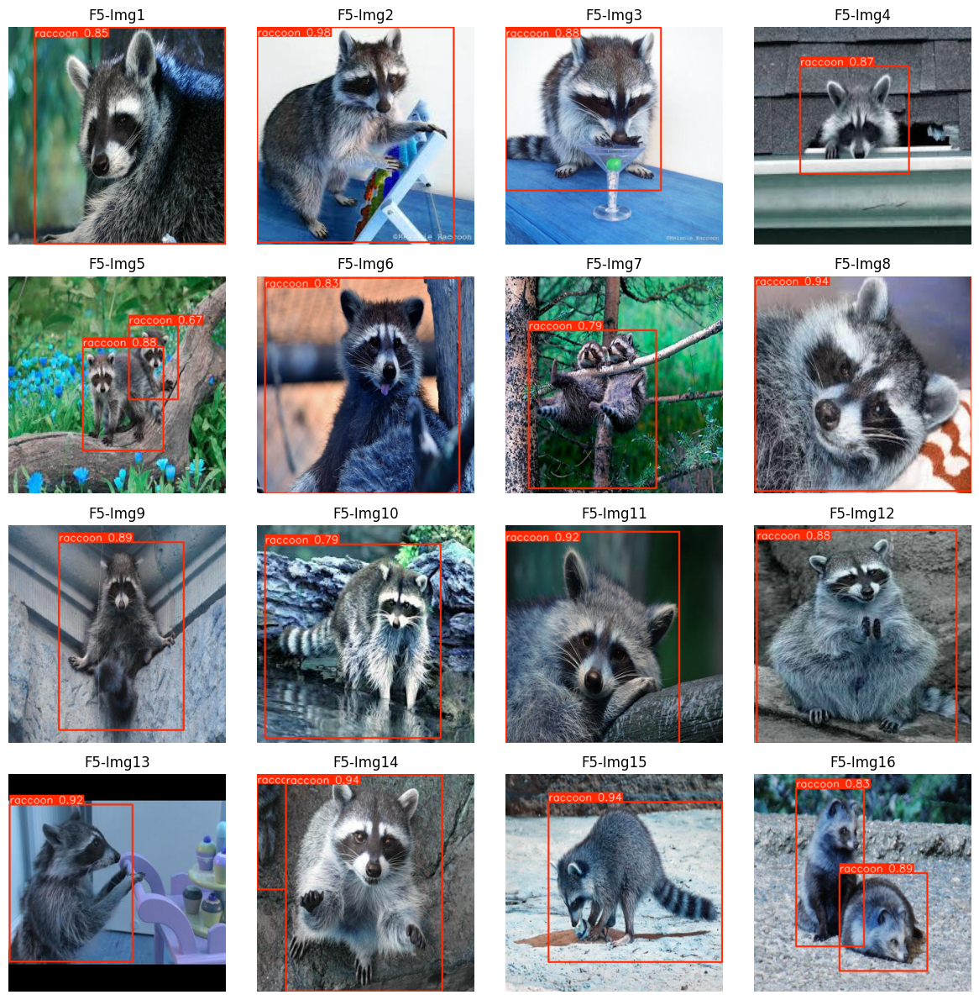

In [31]:
import matplotlib.pyplot as plt
from ultralytics import YOLO

weights = [
    "/content/kfold_demo/fold_1/weights/best.pt",
    "/content/kfold_demo/fold_2/weights/best.pt",
    "/content/kfold_demo/fold_3/weights/best.pt",
    "/content/kfold_demo/fold_4/weights/best.pt",
    "/content/kfold_demo/fold_5/weights/best.pt",
]

test_dir = "/content/test/images"

for fi, w in enumerate(weights, start=1):
    model = YOLO(w)
    results = model.predict(source=test_dir)

    count = min(16, len(results))
    plt.figure(figsize=(12, 12))

    for i, res in enumerate(results[:count]):
        img = res.plot()
        ax = plt.subplot(4, 4, i + 1)
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(f"F{fi}-Img{i+1}")

    plt.tight_layout()
    plt.show()

참고자료: https://docs.ultralytics.com/ko/guides/kfold-cross-validation/#k-fold-dataset-split